# Experiment 7: Transistors and Amplification

Date: Oct. 24 2025

Name: Mufaro Machaya

Partner: Omar Hui

Student ID: 19011808

In [1]:
from common import *

**Introductory Notes:**

This lab is about being introduced to transistors, particularly $npn$-BJT transistors. An analogy to transistors for water pipes is like water valves, so they're used to control electrical current, but unlike how a valve alters current mechanically with a physical block, the transistor alters current based on the voltage differences between 

1. the collector (or input), 
2. the base (essentially the voltage difference provider or control, in a sense), and 
3. the emitter (or output).

Electricity travels from areas of high voltage to low voltage (thus why current requires a voltage difference), so current will travel through the transistor from the collector to the emitter if there is a forward bias from the collector to the base to the emitter (and a reverse-bias from the emitter to the base to the collector), i.e., the voltage is higher in the forward direction than the backward direction. This allows the voltage of the base to control the flow of current like a valve. 

This also allows for signals to be amplified through the transistor (thus why the circuit is called an amplifier).

**Learning Goals:**

> - know how to build a simple transistor amplifier
> - know the limitations of an amplifier, especially the distortion that occurs when voltage limits
are exceeded
> - measure and understand what linearity means in amplified signals

### DMM Measurement Uncertainties

This lab requires the measurement of $10$ $k\Omega$ and $1$ $k\Omega$ resistors, which have an uncertainty function of
$$u[R](R)_{0.001} = R \times 0.5\% + 3 \times 0.001$$
for $1$ $k\Omega$ and
$$u[R](R)_{0.01} = R \times 0.5\% + 3 \times 0.01$$
respectively.

In [2]:
def record_resistance(resistance: np.float64, precision: int):
    resistance_uncert = resistance * 0.5/100 + 3 * 10 ** (-precision)
    print(f'R = {resistance:.3f} +/- {resistance_uncert:.3f} k Ohm')
    return resistance * 1e3, resistance_uncert * 1e3

Then, this lab requires a measurement of capacitance of roughly $1$ $\mu F$ (in hundreds of $nF$, so $0.1$ $nF$ precision), which would yield an uncertainty function [2](https://www.manualslib.com/manual/1596837/Aneng-Q1.html?page=24#manual) of
$$u[C](C) = C \times 2.0\% + 5 \times 0.1 \text{ } nF$$

In [3]:
def record_capacitance(capacitance: np.float64):
    capacitance_uncert = capacitance * 2/100 + 5 * 0.1
    print(f'C = {capacitance*1e-3:.3f} +/- {capacitance_uncert*1e-3:.3f} micro-F')
    return capacitance * 1e-9, capacitance_uncert * 1e-9

## Part I: Voltage Amplification using a Transistor

**Intro Notes:**

For this lab, I need to build the following circuit:

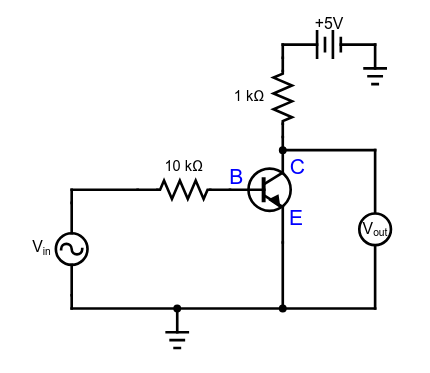

in the pre-lab, I built it as the following:

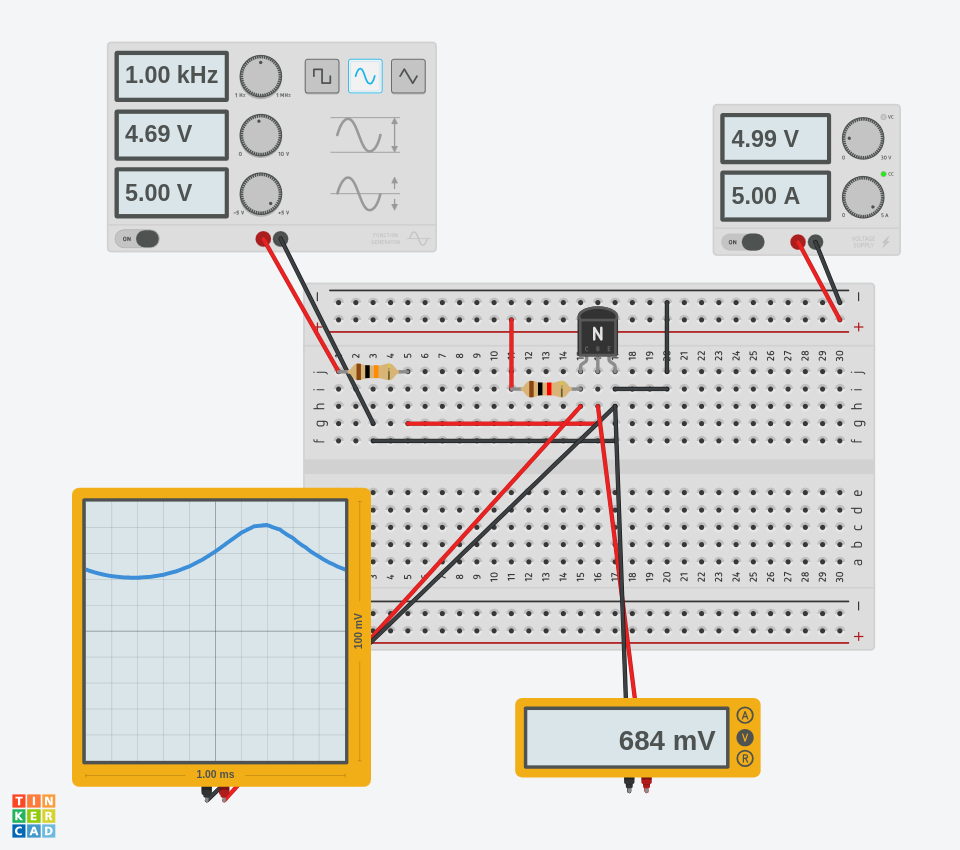

> Find a 10 $k\Omega$ resistor and a 1 $k\Omega$ and record the measurements of their resistances in your notebook. Install the two resistors as shown in Fig. 2.

The first 10k resistor is $R_{10k} = 9.90 \pm 0.08$ $k\Omega$ and the $1$ $k\Omega$ resistor is $0.989 \pm 0.008$ $k\Omega$.

In [4]:
resistance_10k, resistance_uncert_10k = record_resistance(9.90, 2)
resistance_1k,  resistance_uncert_1k  = record_resistance(0.989, 3)

R = 9.900 +/- 0.080 k Ohm
R = 0.989 +/- 0.008 k Ohm


> Adjust the function generator to produce a sinusoidal signal with a frequency 100Hz, an amplitude of 0.1V and an offset voltage equal to zero. Then connect the voltage lead to the unattached end of the 10 $k\Omega$ resistor; the other end (ground) should go to the emitter end of the transistor. This will be the input voltage signal that will be amplified.

> Make the necessary connections so you can the monitor the input voltage on CH1 and the output voltage from the collector on CH2. Use AC coupling to the scope for CH1 so you can adjust the offset voltage on the function generator without having to readjust the trigger level. Monitor the output voltage signal at the collector on CH2 of the scope. Keep CH2 on DC coupling so you can observe any offset in the output signal.

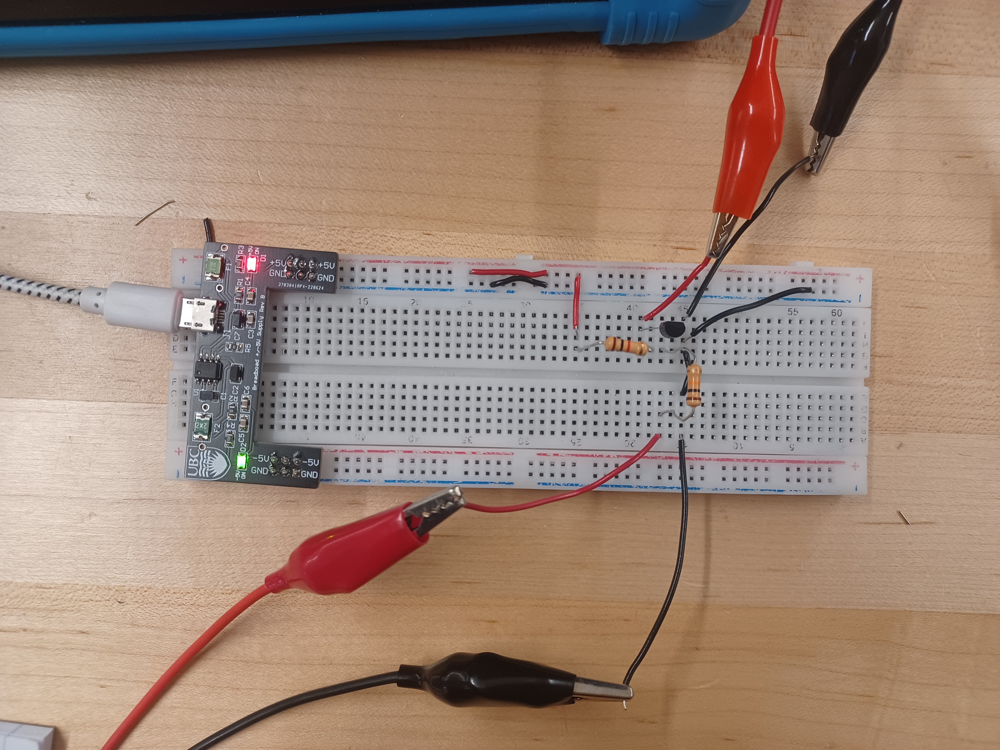

This is the circuit we ended up building.

> Now you can turn on the power to the protoboard. Increase the voltage offset on the function generator from 0 to 1.4 V in small steps of 0.1 V. Report what you observe as the offset voltage changes and save some screenshots (enough to help you describe the behaviour, but you don’t need to save them at increments of 0.1 V) of the signals you see to include in your notes. In particular make note of the range of offset voltages for which the output signal is an undistorted sine function. Also make note of the amplitude of $V_{out}(t)$ versus $V_{in}(t)$ when there is no distortion

**Observations:**

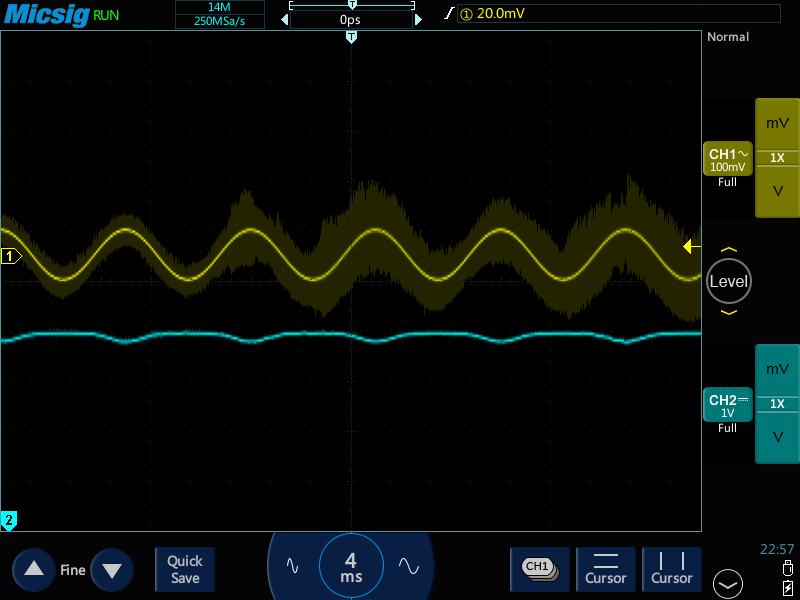

- At $V_{offset}=0-0.5$ $V$, CH2 is completely (or nearly completely) flat, with little/no change.
- Some slight curving is observed around 0.6 V and it increases in curving as we get higher. One side of the wave, the negative ends, are flattened around here.

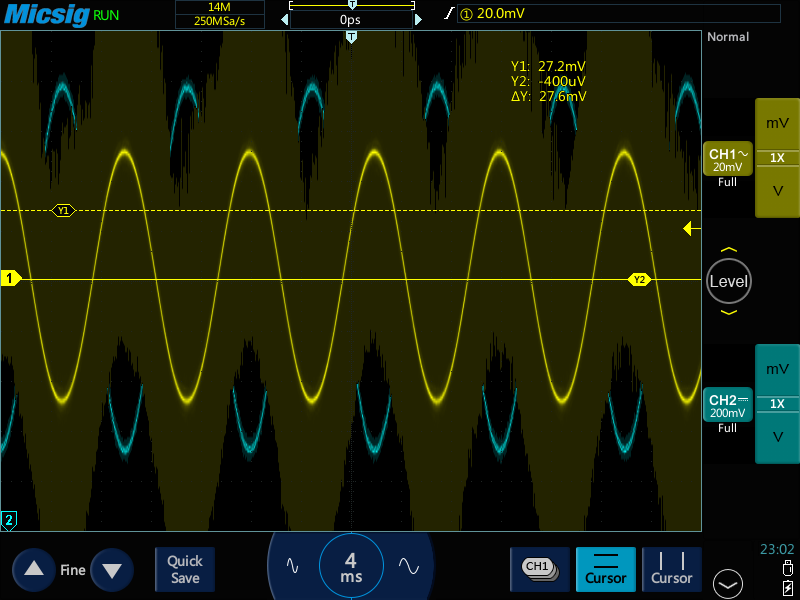

- At 0.7 V, it becomes a fully sinusoid wave again.
- The wave is peak amplitude around 0.9 V (with an amplitude of about $1.46$ $V_{pp}$), which is about a $14.6\times$ amplification from the input amplitude.

- Around 1.0 V, the amplitude starts to go back down again.
- Around 1.2 V, the wave has a flattened positive (top) half.
- Around 1.4 V, the wave becomes flat again.

> Obtain an undistorted signal to determine the gain:
> - Choose an offset voltage for Vin in the middle of the range where you are confident there is no distortion in $V_{out}$. Save the data for both CH1 and CH2.
> - Plot both CH1 and CH2 together, and fit a sine wave to each to determine the amplitudes and
calculate the gain.

Both of these signals are at $0.1$ $V_{pp}$ amplitude with $0.9$ $V$ offset and $100$ $Hz$ frequency.

In [5]:
gopts = VOLTAGE_VERSUS_TIME_GRAPH_OPTIONS

In [6]:
ch1 = load_channel('data/ch1round1.csv')
ch2 = load_channel('data/ch2round1.csv')

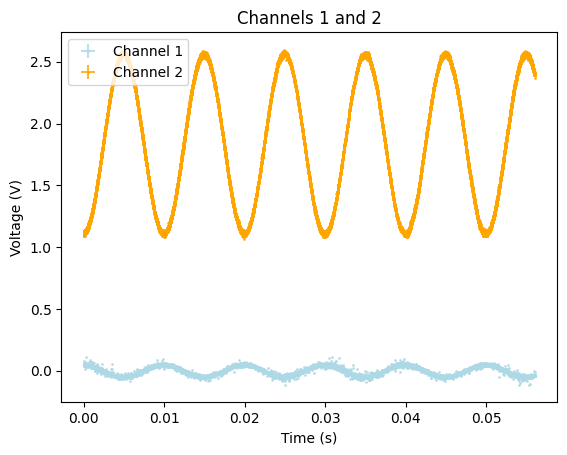

In [7]:
plot_channels(ch1, ch2, gopts)

**Observations:**
- We can visually observe that channel 2 is amplified with respect to channel 1.
- Oddly, channel 1 seems like a noisier signal than channel 2.

**Channel 1**

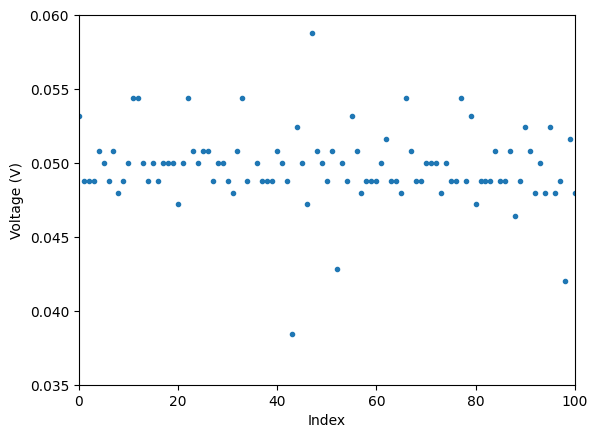

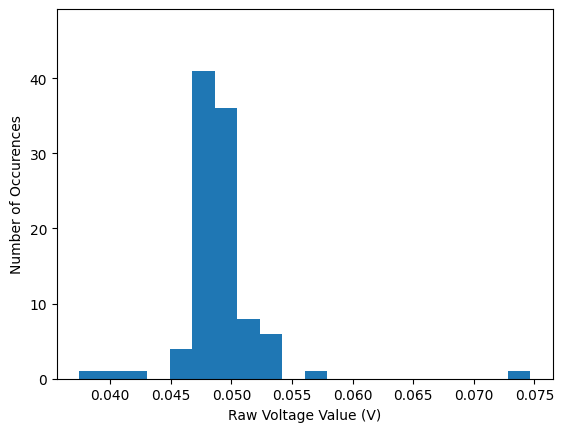

Mean =  0.04997599999999999 0.00357404868461525
Standard Deviation (Noise Value) =  0.00357404868461525


In [8]:
std_dev_ch1  = calculate_uncertainty(
    (ch1.x, ch1.y), 
    method="default",                  
    indices_range=(0, 100), 
    y_range=(0.035, 0.060),
    plot=True, graphing_options=gopts
)

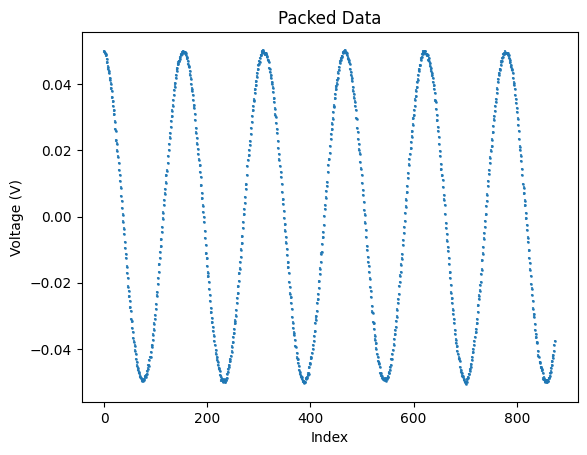

In [9]:
ch1_packed = pack_data(
    (ch1.x, ch1.y), 
    std_dev_ch1, p=100, 
    plot=True, graphing_options=gopts
)

**Note:** I used the initial paramters of $0.5$ $V$ based off of directly observing the channel plot with $f=100$ $Hz$ and $\phi = 0$ rad due to the values taken directly from the wave generator.

In [10]:
model_ch1 = SineModel(amplitude=0.05, frequency=100, phase=0)

In [11]:
results_ch1 = autofit(ch1_packed, model_ch1, gopts)
print_results(model_ch1, results_ch1)

+---------------+-----------+---------------+
| Measurement   |     Value |   Uncertainty |
+===============+===========+===============+
| Amplitude     |   0.04978 |     1.7e-05   |
+---------------+-----------+---------------+
| Frequency     | 100       |     0.003447  |
+---------------+-----------+---------------+
| Phase         |   1.657   |     0.0006894 |
+---------------+-----------+---------------+
Chi^2 = 1.277


**Observations:**
- The model obtained:
    1. $V_{0}=0.49780 \pm 0.00002$ $V$
    2. $f=100.000 \pm 0.003$ $Hz$
    3. $\phi = 1.6570 \pm 0.0007$ rad.
    
  These values are more or less what was expected, but the phase is roughly $\pi/2$, so the offset is roughly half a period.
- The model got $\chi^2=1.277$, indicating that it's likely a good fit. We can verify this from the graphs.

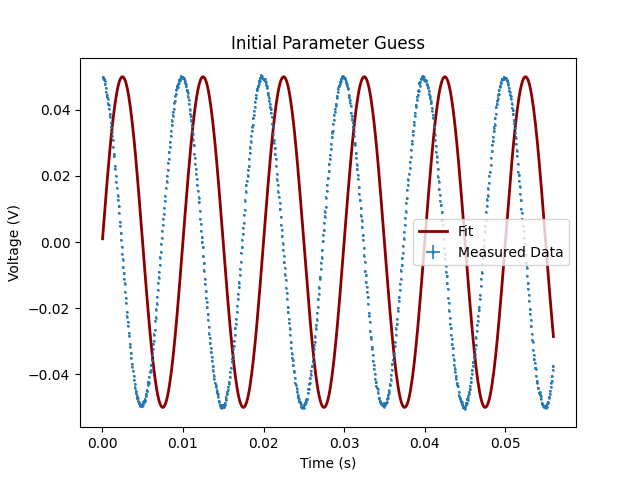

In [12]:
display(results_ch1.initial_guess_graph)

**Observations:**
- Initial guesses were mostly correct except for a phase.

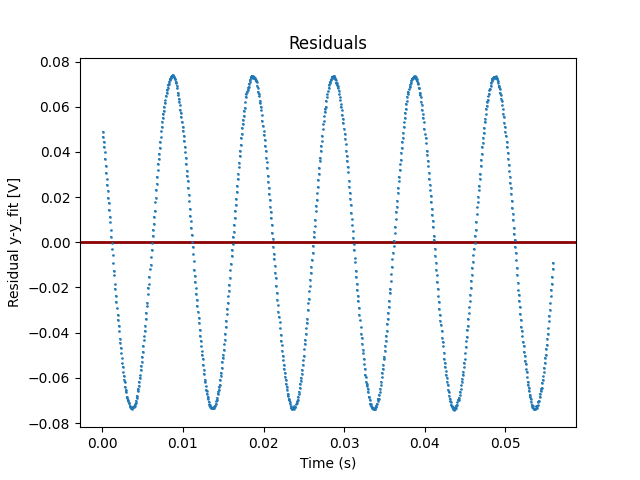

In [13]:
display(results_ch1.initial_guess_residuals_graph)

**Observations:**
- A sinusoid residuals graph on the phase further confirms this. It's completely uniform, so the phase is incorrect.

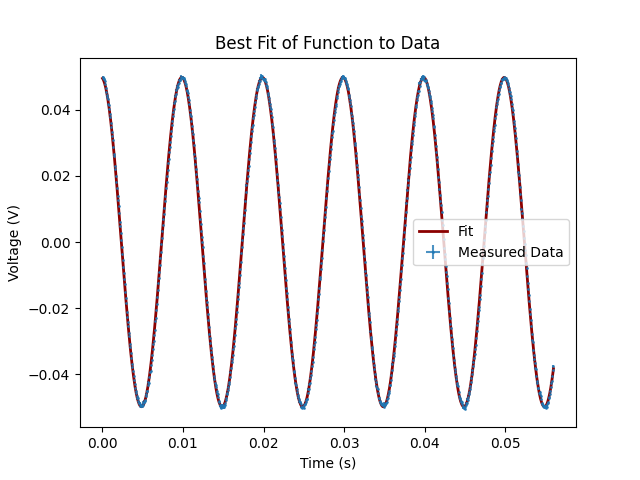

In [14]:
display(results_ch1.autofit_graph)

**Observations:**
- Visual observation looks good, the model seems to match.

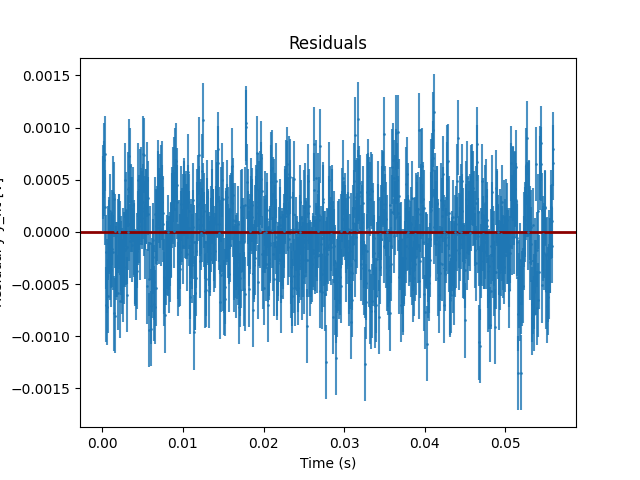

In [15]:
display(results_ch1.autofit_residuals_graph)

**Observations:**
- The residuals for the graph seems mostly good, as there isn't a pattern to the residuals and the residuals are completely bisected. Thus, we can conclude that the model seems good.
- The only deviation from the model from expectations is the phase, and I'm not entirely certain why this would be, but we can assume that this is probably just due to the physical signal being delayed or some other phenomenon. 

**Channel 2**

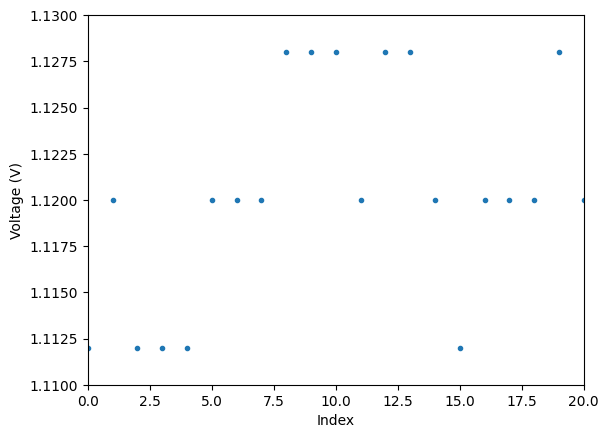

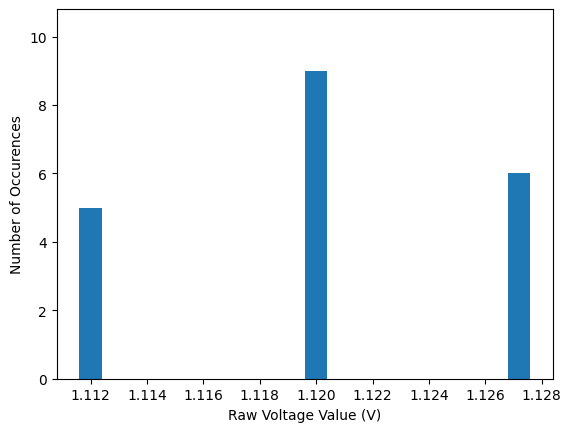

Mean =  1.1204000000000003 0.005919459434779417
Standard Deviation (Noise Value) =  0.005919459434779417


In [16]:
std_dev_ch2  = calculate_uncertainty(
    (ch2.x, ch2.y), 
    method="default",                  
    indices_range=(0, 20), 
    y_range=(1.11,1.13),
    plot=True, graphing_options=gopts
)

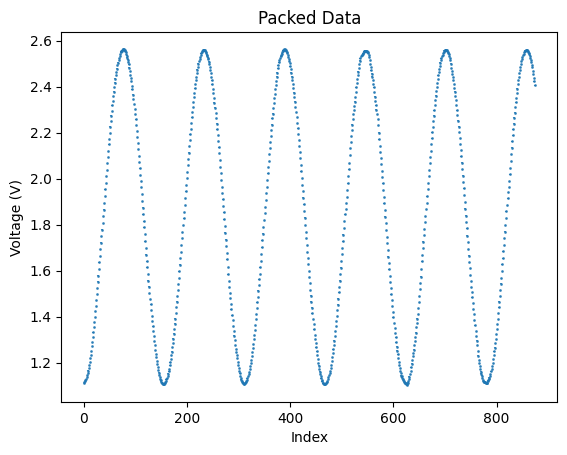

In [17]:
ch2_packed = pack_data(
    (ch2.x, ch2.y), 
    std_dev_ch2, p=100, 
    plot=True, graphing_options=gopts
)

**Note:** Using an offset sine model now, with the initial parameters of $V_0=1.46$ V (from measuring on the oscilloscope), $f=100$ Hz and $\phi=0$ rad (again, from the wave generator) and $V_{offset}=0.9$ V (from the wave generator).

In [18]:
model_ch2 = OffsetSineModel(amplitude=1.46, frequency=100, phase=0, offset=0.9)

In [19]:
results_ch2 = autofit(ch2_packed, model_ch2, gopts)
print_results(model_ch2, results_ch2)

+---------------+----------+---------------+
| Measurement   |    Value |   Uncertainty |
+===============+==========+===============+
| Amplitude     |   0.7281 |     2.815e-05 |
+---------------+----------+---------------+
| Frequency     | 100      |     0.0003908 |
+---------------+----------+---------------+
| Phase         |  -1.51   |     7.828e-05 |
+---------------+----------+---------------+
| Offset        |   1.836  |     2.007e-05 |
+---------------+----------+---------------+
Chi^2 = 32.838


This model obtained:
1. $V_0 = 0.72810 \pm 0.00003$ V, which is about half of my initial guess as I miscalculated on the oscilloscope and used the peak-to-peak voltage.
2. $f=100.0000 \pm 0.0004$ Hz - obligatory.
3. $\phi=-1.51000 \pm 0.00008$ rad, which about $-\pi/2$, which is certainly curious, and I'll explain this further later.
4. $V_{offset}=1.83600 \pm 0.00002$ V, which is roughly my initial guess.
5. $\chi^2 = 32.838$, which indicates that the model was likely a poor fit. We can explore this with the autofit further later.

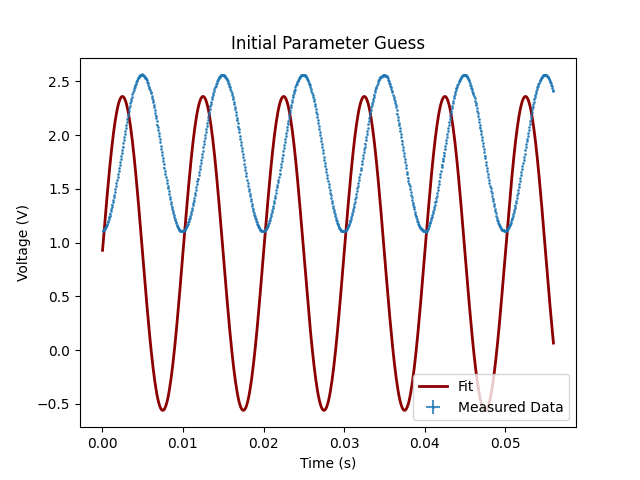

In [20]:
display(results_ch2.initial_guess_graph)

**Observations:** The initial fit seems to look good, even so far as to not require a phase change or amplitude change, so the difference in paramters for the phase change and the amplitude are definitely curious. I wonder what the problem is, then. Likely, the phase change was necessary just to overcompensate for the slight observed difference, and I suppose that we'll see this in the residuals.

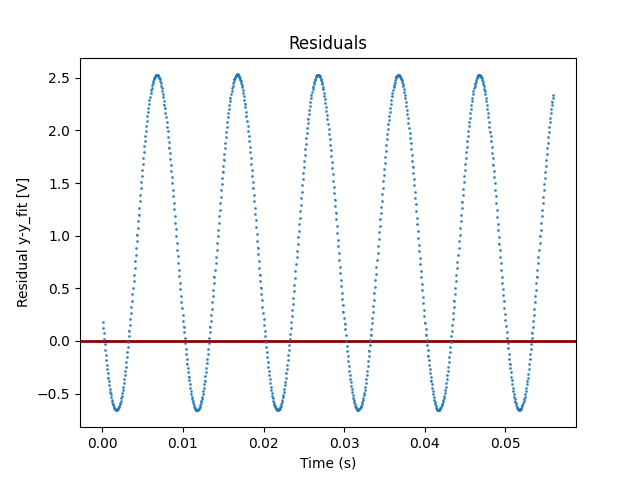

In [21]:
display(results_ch2.initial_guess_residuals_graph)

**Observations:** The initial residuals seem fine as well, almost completely bisected. I wonder what the problem could be, then.

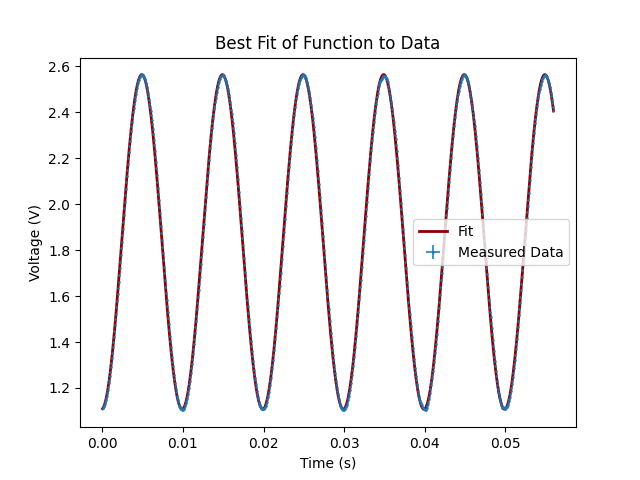

In [22]:
display(results_ch2.autofit_graph)

**Observations:** Very little difference seems observed between the initial fit and the residuals, but I think the reason why they are roughly equivalent results is that the amplitude is reduced to account for the offset (or something like that).

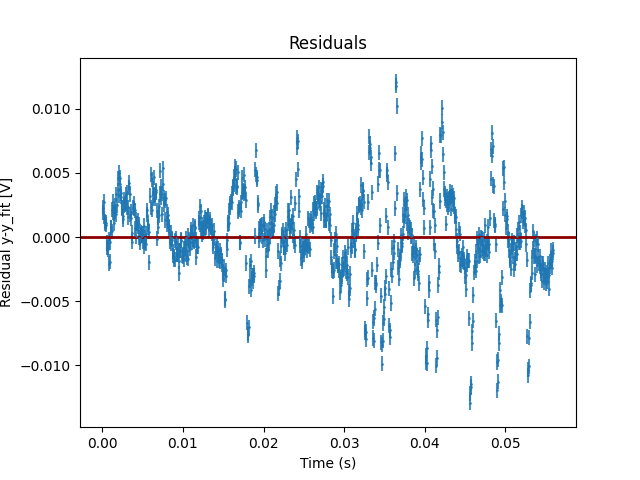

In [23]:
display(results_ch2.autofit_residuals_graph)

**Observations:** The residuals graph looks good, nearly perfectly bisected. The data does seem to have a slightly sinusoidal pattern, but it definitely looks more like noise than functional output. 

### (Post-Lab) Gain Calculation

$$\beta = \frac{V_{out}}{V_{in}}$$
$$u[\beta] = \beta \sqrt{\left(\frac{u[V_{out}]}{V_{out}}\right)^2 + \left(\frac{u[V_{in}]}{V_{in}}\right)^2}$$

In [53]:
vin,  uvin  = model_ch1.param_values[0], model_ch1.param_uncerts[0]
vout, uvout = model_ch2.param_values[0], model_ch2.param_uncerts[0]

In [55]:
gain_1   = vout / vin
u_gain_1 = gain_1 * np.sqrt((uvin/vin) ** 2 + (uvout / vout) ** 2)
print(f'Gain (1): {gain_1:.3f} +/- {u_gain_1:.4f}')

Gain (1): 14.626 +/- 0.0050


(Post-Lab) The gain is calculated from this initial dataset is $\beta = 14.626 \pm 0.005$.

**Conclusions:**
- The "sweet spot" for amplification is at the middle of the range of offsets that produce sinusoidal waves whatsoever -- roughly $0.9$ V out of $0.5$-$1.5$ V
- Channel 2 ended up being much noisier than channel 1 despite the visual observation.

## Part II: An Improved Amplifier

I need to add the following additional circuit part to the previous circuit:

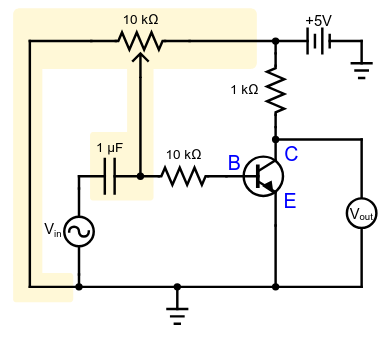

> Modify your circuit to apply a variable voltage offset at the base according to the circuit diagram in Fig. 4

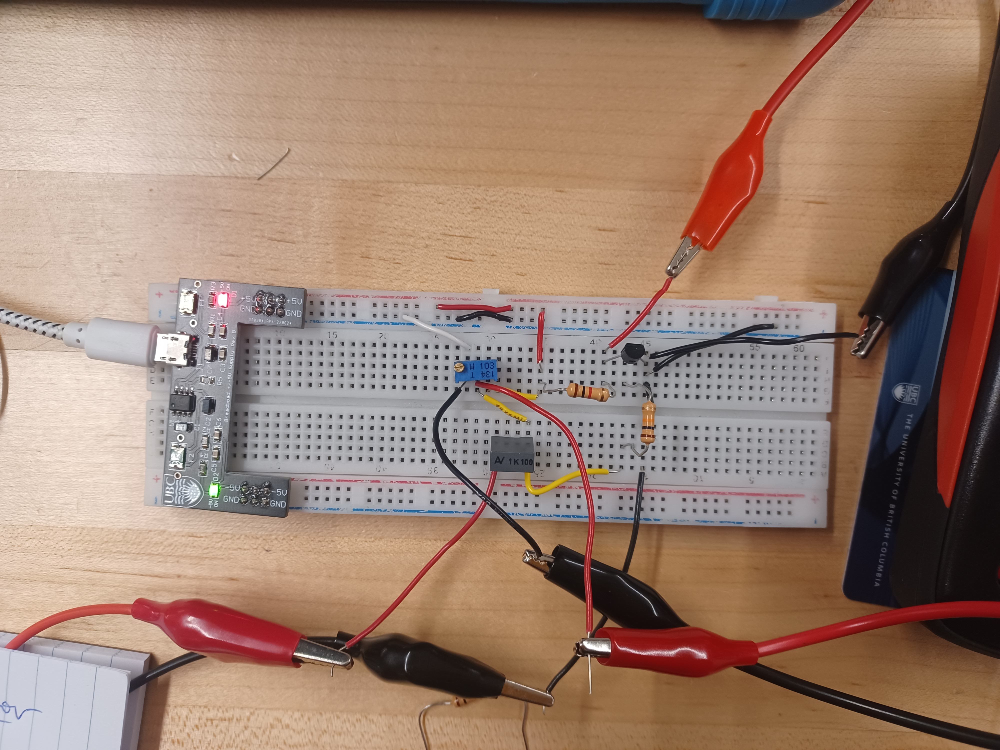

Capacitor:

In [24]:
capacitance, capacitance_uncert = record_capacitance(987.6)

C = 0.988 +/- 0.020 micro-F


> Set the offset on the function generator to zero and instead tune the variable resistor to find the best offset voltage. Make sure you are taking notes throughout this process.

> Measure the AC amplitude of the output signal as a function of the AC amplitude of the input
voltage signal using the cursors or measure functions similar to Experiment 04. It may be
necessary to adjust the offset voltage slightly to avoid distortion.

We chose to measure by using the measurement functions, so we're just reading directly off of the oscilloscope to save time.

In [25]:
v_ch2 = np.array([2.26, 2.90, 2.26, 3.18, 3.42, 3.50, 3.86, 4.26, 4.58 ]) # V
v_ch1 = np.array([340,  400,  440,  480,  540,  580,  620,  700,  840  ]) * 1/1000 # mV

Assuming standard uncertainty for both channel measurements due to being on the oscilloscope, i.e. $u[V_{1 V}]=\frac{1}{2\sqrt{3}}$ V and $u[V_{1 mV}]=\frac{1}{2\sqrt{3}}$ mV

In [26]:
v_ch1_uncert = np.full_like(v_ch2, 0.01/(2 * np.sqrt(3))) * 1/1000
v_ch2_uncert = np.full_like(v_ch2, 1/(2 * np.sqrt(3))) 

In [27]:
voltvolt = GraphingOptions(
    x_label='Voltage',
    y_label='Voltage',
    x_units='V',
    y_units='V'
)

In [28]:
data2 = Dataset(
    x = v_ch1,
    y = v_ch2,
    
    dx = v_ch1_uncert,
    dy = v_ch2_uncert
)

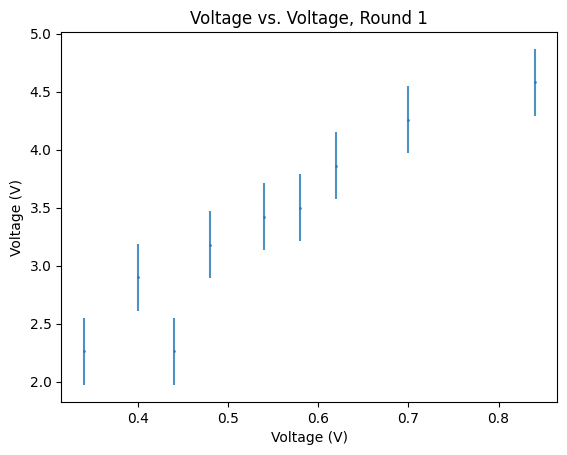

In [29]:
plot_dataset(data2, voltvolt)

(Post-Lab) I'm using trivial values for the initial guess parameters as the linear fit should still be able to optimize for the correct value. Another potential option would be to use the previously calculated $\beta$, but it should still optimize the same.

In [ ]:
model_lin = OffsetLinearModel(slope=1,intercept=0)

In [30]:
results_lin = autofit(data2, model_lin, gopts)
print_results(model_lin, results_lin)

+---------------+---------+---------------+
| Measurement   |   Value |   Uncertainty |
+===============+=========+===============+
| Slope         |  4.901  |        0.6519 |
+---------------+---------+---------------+
| Intercept     |  0.6678 |        0.3705 |
+---------------+---------+---------------+
Chi^2 = 0.902


The linear fit obtained a slope of $\beta = 4.901 \pm 0.652$ with an intercept of $0.6678 \pm 0.3705$ $V$. 

(Post-Lab) The intercept can be explained as accounting for the voltage at the base when no voltage is applied at the collector, so a two-parameter model would be necessary to account for this. The $\chi^2$ is roughly 1, so the model probably fits the data well.

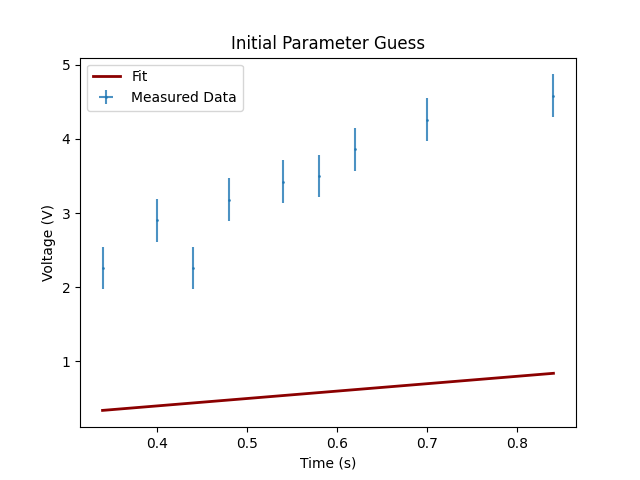

In [31]:
display(results_lin.initial_guess_graph)

(Post-Lab) **Observation:** The initial parameter guess was obviously quite wrong. This is understandable as I used trivial values for the initial guess, so there was absolutely no physical backing for them.

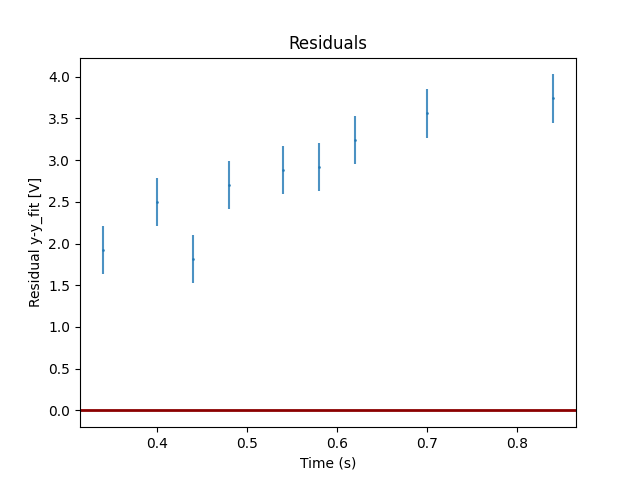

In [32]:
display(results_lin.initial_guess_residuals_graph)

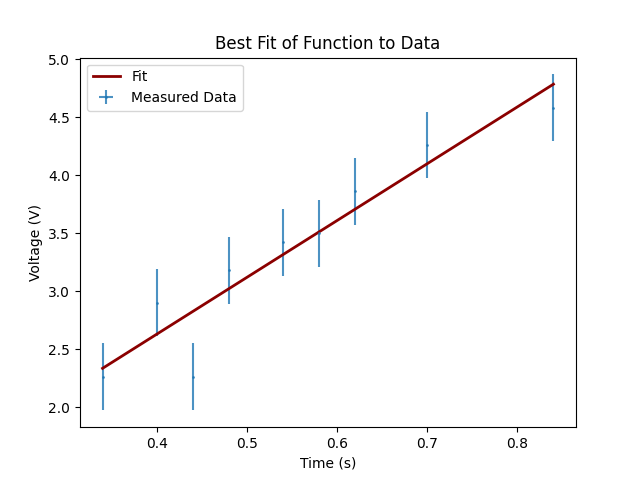

In [33]:
display(results_lin.autofit_graph)

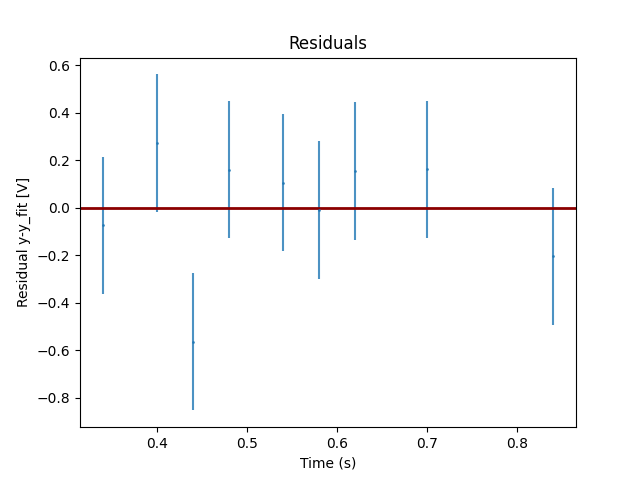

In [34]:
display(results_lin.autofit_residuals_graph)

**Observations:** Visual inspection hints that the residuals of this data may be underestimated.

> Determine the voltage amplification gain by making a plot of the output voltage amplitude
versus the input voltage amplitude; it should be fairly linear, and the gain is simply the slope.
Check the limitations on the linear response of the amplifier - what is the range over which
the output is proportional to the input? This is the linear range of the amplifier you have built.

The estimated slope is roughly $\beta=4.901 \pm 0.652$, so the gain is about 4.9.

>  For the largest input amplitude used, save the full .csv file so you can perform a sine fit to check
for distortion

The largest input amplitude we used was 840 mV.

In [35]:
ch1_2 = load_channel('data/ch1part2.csv')
ch2_2 = load_channel('data/ch2part2.csv')

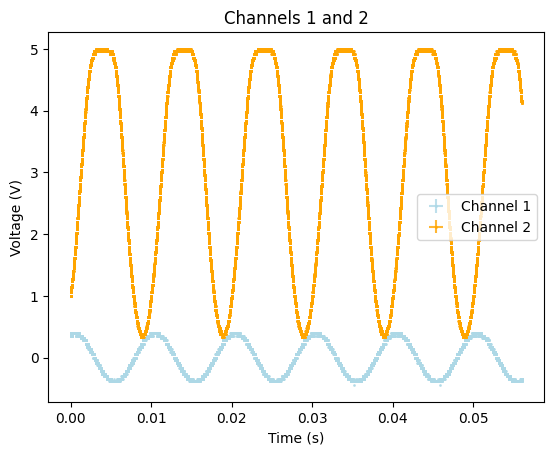

In [36]:
plot_channels(ch1_2, ch2_2, gopts)

**Observation:** The highest input voltage seems to have flattened positive peaks, so we clearly can observe some distortion at an input voltage this high. Therefore, we can probably just visually assume that this is not a sinusoidally-conforming wave, but we can confirm this further from performing a fit.

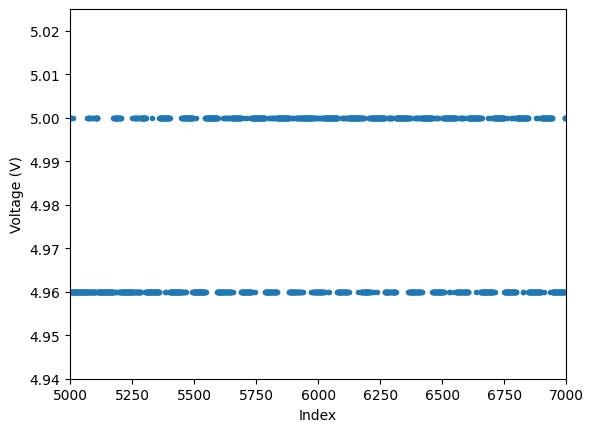

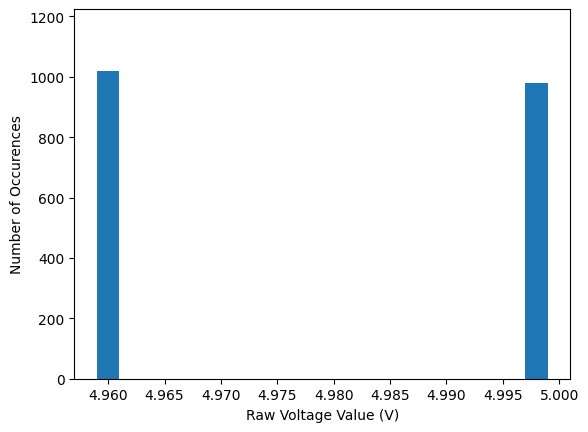

Mean =  4.9796000000000005 0.019995999599919996
Standard Deviation (Noise Value) =  0.019995999599919996


In [37]:
std_dev_ch2_2  = calculate_uncertainty(
    (ch2_2.x, ch2_2.y), 
    method="default",                  
    indices_range=(5000, 7000), 
    y_range=(4.94,5.025),
    plot=True, graphing_options=gopts
)

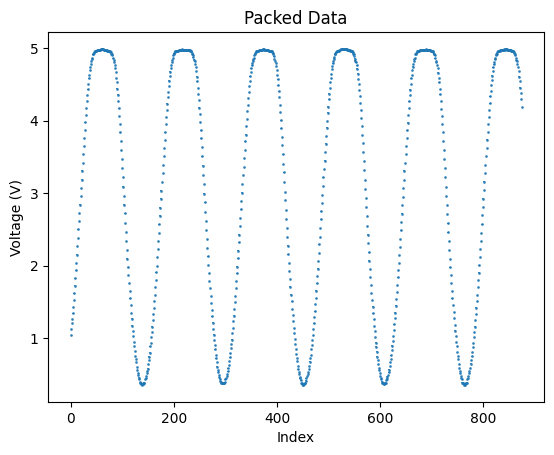

In [38]:
ch2_2_packed = pack_data(
    (ch2_2.x, ch2_2.y), 
    std_dev_ch2_2, p=100, 
    plot=True, graphing_options=gopts
)

In [39]:
model_ch2_2 = OffsetSineModel(amplitude=5, frequency=100, phase=0, offset=0.840)

In [40]:
results_ch2_2 = autofit(ch2_2_packed, model_ch2_2, gopts)
print_results(model_ch2_2, results_ch2_2)

+---------------+---------+---------------+
| Measurement   |   Value |   Uncertainty |
+===============+=========+===============+
| Amplitude     |  2.45   |     9.612e-05 |
+---------------+---------+---------------+
| Frequency     | 99.95   |     0.0003809 |
+---------------+---------+---------------+
| Phase         | -0.8932 |     7.635e-05 |
+---------------+---------+---------------+
| Offset        |  3.017  |     6.785e-05 |
+---------------+---------+---------------+
Chi^2 = 18562.085


This model produces
1. $\chi^2 = 18562.085$, indicating that the model is undoubtedly not a good fit.
2. $V_0 = 2.4501 \pm 0.0001$, which is about half of the expectation (due to putting in the voltage from peak to peak)
3. $f=99.9500 \pm 0.0004$, which is roughly the expectation value.
4. $\phi=-0.89320 \pm 0.00008$ rad
5. $V_{offset}=3.01700 \pm 0.00007$ V, which makes sense given the difference in amplitude.

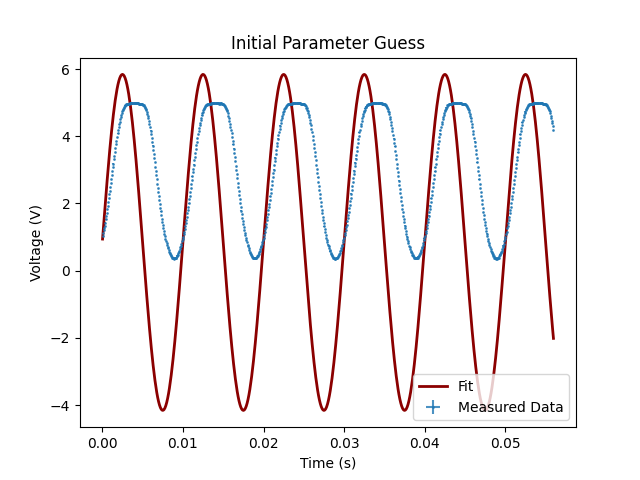

In [41]:
display(results_ch2_2.initial_guess_graph)

**Observation:** The initial parameter guess looks fairly bad. The amplitude is too high, about $2\times$ too high, and the frequency is also too high, to begin with.

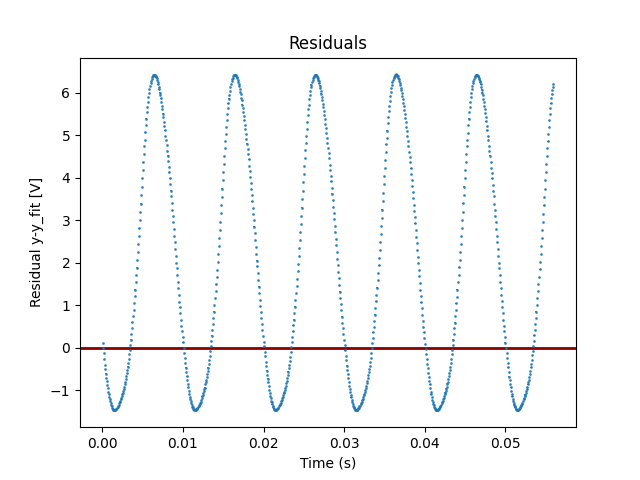

In [42]:
display(results_ch2_2.initial_guess_residuals_graph)

**Observation:** As expected, the initial parameter guess residuals are quite poor as well.

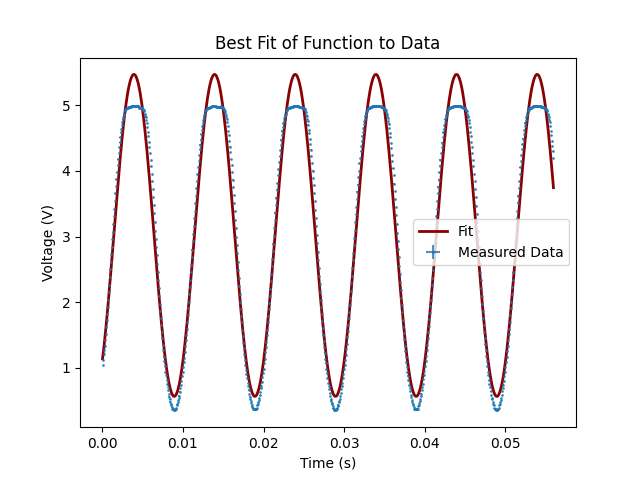

In [43]:
display(results_ch2_2.autofit_graph)

**Observation:** We can visually observe the deviation of the data from a sinusoidal plot, because the sin plot seems to fairly well match the data toward the basepoints (middlepoints between peaks and troughs) but deviates the most at the peaks and troughs.

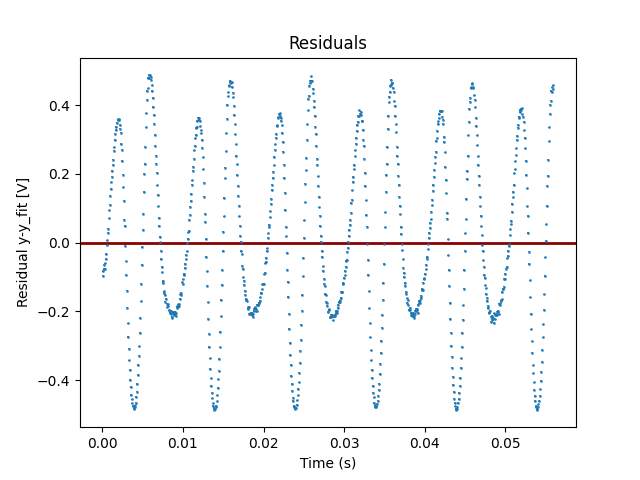

In [44]:
display(results_ch2_2.autofit_residuals_graph)

**Observation:** We can best visually see the deviation at the peaks and troughs can be viewed by the sinusoidal-looking graph of these residuals. This implies, without a doubt, that there is distortion due to the offset being too high.

> Based on the tutorial 6 and the theory for this amplifier discussed in Semiconductornotes.pdf
what is β for your transistor?

In [67]:
print(f't\' = {calculate_t_score(a=14.626, da=0.005, b=4.901, db=0.652):.2f}')

t' = 14.92


(Post-Lab) The first round of data collection obtained $\beta = 14.626 \pm 0.005$ by comparing the amplitudes of the input and output waves and this latest round obtained $\beta = 4.901 \pm 0.652$ overall. Together, these two values produce $t'=14.92$, indicating that they are completely different measurements. Obviously, this is a $3\times$ difference, so that makes these results somewhat inconclusive, but we can surmise as to why. 

The best guess I can give to explain this behavior is in the differences in how the data was collected in each round. The first round had a singular amplitude and offset, and the gain was calculated based off of the amplitudes of the input and output wave signals, whereas the second round used constant amplitude and varied offset, and we know that amplification based on offset in the first round would have specific offsets increase amplification over others, so maintaining a constant offset would likely be the most effective method to calculate the gain. From directly observing the linearity of the second round's measurements, it's easy to say that the more trustworthy measurement of the two would be the second round's $\beta = 4.901 \pm 0.652$, especially considering that it's a calculation obtained over a range of samples rather than on